----
# Asignatura: Técnicas avanzadas de análisis de datos
<left> Nombre: Rodrigo Valdelvira Ortigosa 
<left> Actividad 1 convocatoria ordinaria 

----

# MODELO: Regresión Elastic Net 

## 1. Definición del modelo

### 1.1 Introducción

El modelo escogido para desarrollar la actividad ha sido *Elastic Net* pero, antes de empezar es necesaria una pequeña introducción a través de la regresión lineal múltiple y dos de sus variantes más utilizadas Ridge y Lasso para comprender las ventajas que otorga dicho modelo sobre otras regularizaciones.

### 1.2 Regresión lineal múltiple:

El propósito es el de predecier *n* observaciones de una variable objetivo mediante una combinación lineal de *m* variables predictoras X y un término de error distribuido normalmente con varianza $\sigma^2$.

$$Y=Xw+\epsilon $$
$$\epsilon\approx  N(0,\sigma^2) $$

La obtención de los pesos se consigue mediante la siguiente expresión:
$$W = (X^TX)^{-1} (X^TY) $$

Función de coste a minimizar:

 $$   J_{OLS}=\sum_{n=1}^N(y^{(n)} - x_m^{(n)}w_m)^2  $$

- *X*: Variables independientes utilizadas como predictores.
- *y*: variable objetivo con n observaciones.
- *w*: Conjunto de pesos que ponderan cada una de las m características.
- *J*: Funciónd e coste a minimizar (OLS: Ordinary Least squares)

### 1.3 Regresión Ridge:

 Este modelo se ideo para reducir la complejidad de la regresión lineal múltiple mediante una reducción dimensional, solo que en lugar de forzar a cero los coeficientes se penalizan. De este modo se añade un término más a la ecuación general con un parámetro $\lambda$ que tiende a minimiza hacia cero los coeficientes $w_m$.
 Función de coste a minimizar:

 $$   J_{Ridge}=\sum_{n=1}^N(y^{(n)} - x_m^{(n)}w_m)^2+\lambda\sum_{m=1}^M w_m^2  $$ 
Donde $\lambda=0$ equivale a una regresión lineal simpel y $\lambda=1$ la regesión es igual a 0.

### 1.4 Regresión Lasso:

La regresión Lasso *(Least Absolute Shrinkage and Selection Operator)* es conceputualmente similar a la de *Ridge* solo que agrega penalizaciones para los coeficientes distintos de cero y mientras que Ridge penaliza la suma de coeficientes al cuadrado *(penalización L2)*, Lasso lo hace sobre la suma de los valores absolutos *(Penalización L1)*. Para valores altos de $\lambda$ muchos coeficientes alcanzan valor cero mientras que con *Ridge* esto no ocurre.
Función de coste a minimizar:

 $$   J_{Lasso}=\sum_{n=1}^N(y^{(n)} - x_m^{(n)} w_m)^2+\lambda\sum_{m=1}^M |w_m|  $$ 

### 1.5 Regresión Elastic Net

El modelo Elastic Net nace de la crítica hacia el modelo *Lasso* cuyo parámetro alpha puede ser demasiado dependiente de los datos y por lo tanto inestable. La solución pasa por combinar las penalizaciones de la regresión de Ridge y Lasso obteniendo así lo mejor de ambos mundos. El modelo se basa en minimizar la siguiente función de coste:


 $$   J_{ENet}=\frac{\sum_{n=1}^N(y^{(n)} - x_m^{(n)} w_m)^2}{2N}+\lambda(\frac{1-\alpha}{2}\sum_{m=1}^M w_m^2+\sum_{m=1}^M 
|w_m|) $$ 

Donde $\alpha$ es el parámetro mezcla entre Ridge ($\alpha=0$) y Lasso ($\alpha=1$)

## 2. Selección del conjunto de datos

Los datos han sido seleccionados de la plataforma *opendata* del *CERN* (Center for European Nuclear Research) que pone a disposición pública petabytes de información para el aprendizaje, sivualización y análisis de las partículas subatómicas.
> Events with two electrons from 2010 https://opendata.cern.ch/record/304: Los datos corresponden a 100k eventos de dielectrones con masa invariante en el rango de 1-110GeV para uso educacional.

Los datos incluyen las siguientes características de cada uno de los dos electrones colisionados en los 100k eventos llevadas a cabo en el *LHC* (The large Hadron Collider):

1. Run: The run number of the event.
2. Event: The event number.
3. E1: The total energy of the electron (GeV).
4. px: Component x of the momemtum of the electron (GeV).
5. py: Component y of the momemtum of the electron (GeV).
7. pz: Component y of the momemtum of the electron (GeV).
7. pt1: The transverse momentum of the electron (GeV).
8. eta1: The pseudorapidity of the electron.
9. phi1: The phi angle of the electron (rad).
10. Q1: The charge of the electron.
11. M: The invariant mass of two electrons (GeV).
12. E2: The total energy of the electron (GeV).
13. px2: Component x of the momemtum of the electron (GeV).
14. py2: Component y of the momemtum of the electron (GeV).
15. pz2: Component y of the momemtum of the electron (GeV).
16. pt2: The transverse momentum of the electron (GeV).
17. eta2: The pseudorapidity of the electron.
18. phi2: The phi angle of the electron (rad).
19. Q2: The charge of the electron.

In [ ]:
from IPython.display import Image
from IPython.core.display import HTML 
Image(url= "https://www.fundacionaquae.org/wp-content/uploads/2019/07/El-Gran-Colisionador-de-Hadrones-LHC-1024x576.jpg", width=500, height=500)

## 3. Planteamiento del problema a resolver

Como objetivo de la actividad, vamos a suponer que somos científicos de datos trabajando para el CERN y se nos encomienda la tarea de encontrar una forma de predecir la energía total de uno de los electrones E1 o E2 en función del resto de características descritas en el apartado superior para poder contrastar futuras pruebas o validar simulaciones, en este caso escogemos E2 como variable objetivo.
Puesto que el propósito es el de predecir una variable en función del resto estamos ante un problema de regresión lineal múltiple y es además supervisado ya que conocemos la clasificación de los datos a través de las etiquetas de cada una de las variables.

## 4. Ánalisis exploratorio de datos (EDA Exploratory Data Analysis)

In [ ]:
# DESCARGA DE DATOS
# ================================================================

import requests
import os
def download_if_missing(url, filename):
    if not os.path.exists(filename):
        os.makedirs(os.path.dirname(filename), exist_ok=True)
        r = requests.get(url, allow_redirects=True)
        with open(filename, 'wb') as f:
          f.write(r.content)

download_if_missing("https://opendata.cern.ch/record/304/files/dielectron.csv", "./dielectron.csv")

In [ ]:
# PREPARACIÓN DEL ENTORNO
# ================================================================

# Importamos las librerías necesarias
import pandas as pd
import numpy as np
import sklearn

import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline

import seaborn as sns

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all" # imprimimos en pantalla el resultado de todos los statements

In [ ]:
# IMPORTACIÓN DE DATOS
# ================================================================

# Creamos un DataFrame para almacenar los datos teniendo en cuenta que están separados por ',', también creamos una lista con todas las características.
features = ['Run','Event','E1','px1','py1','pz1','pt1','eta1','phi1','Q1','E2','px2','py2','pz2','pt2','eta2','phi2','Q2','M']
raw = pd.read_csv('dielectron.csv', sep=',', header=0, names = features)

In [ ]:
# VISUALIZACIÓN PRELIMINAR
# ================================================================

# Mostramos por pantalla los primeros cinco elementos del dataset para obtener una visualización preliminar. 
raw.head()

,Run,Event,E1,px1,py1,pz1,pt1,eta1,phi1,Q1,E2,px2,py2,pz2,pt2,eta2,phi2,Q2,M
0,147115,366639895,58.71410,-7.31132,10.531000,-57.29740,12.82020,-2.20267,2.17766,1,11.2836,-1.032340,-1.88066,-11.0778,2.14537,-2.344030,-2.072810,-1,8.94841
1,147115,366704169,6.61188,-4.15213,-0.579855,-5.11278,4.19242,-1.02842,-3.00284,-1,17.1492,-11.713500,5.04474,11.4647,12.75360,0.808077,2.734920,1,15.89300
2,147115,367112316,25.54190,-11.48090,2.041680,22.72460,11.66100,1.42048,2.96560,1,15.8203,-1.472800,2.25895,-15.5888,2.69667,-2.455080,2.148570,1,38.38770
3,147115,366952149,65.39590,7.51214,11.887100,63.86620,14.06190,2.21838,1.00721,1,25.1273,4.087860,2.59641,24.6563,4.84272,2.330210,0.565865,-1,3.72862
4,147115,366523212,61.45040,2.95284,-14.622700,-59.61210,14.91790,-2.09375,-1.37154,-1,13.8871,-0.277757,-2.42560,-13.6708,2.44145,-2.423700,-1.684810,-1,2.74718


In [ ]:
# NÚMERO DE OBSERVACIONES Y TIPO DE DATOS
# ================================================================

# Reemplazamos cualquier valor anómalo representado por '?' con 'NaN'.
raw.replace("?", np.nan, inplace = True)

# Función para calcular el porcentaje de elementos 'NaN' y visualizar el tipo de datos.
def missing_data(df):
    total   =  df.isnull().sum()
    percent = (df.isnull().sum()/df.count()*100).round(3)
    df_missing_data = pd.DataFrame(({'NaN': total, '%': percent, 'types': df.dtypes}))
    return df_missing_data

In [ ]:
# Aplicamos la función al dataset e imprimimos su dimensión.
missing_data(raw)
raw.shape

,NaN,%,types
Run,0,0.000,int64
Event,0,0.000,int64
E1,0,0.000,float64
px1,0,0.000,float64
py1,0,0.000,float64
pz1,0,0.000,float64
pt1,0,0.000,float64
eta1,0,0.000,float64
phi1,0,0.000,float64
Q1,0,0.000,int64


(100000, 19)

- Se observa que todas las características son de tipo float64 a excepción de `Run`, `Event`, `Q1` y `Q2` que son int64. 
- La masa invariante del electrón `M` tiene 85 elementos NaN.
- El dataset cuenta con 100k elementos y 19 variables.

In [ ]:
# ELEMENTOS FALTANTES
# ================================================================

# Rellenamos los espacios vacíos con la media de la variable. Otra opción podría ser eliminarlos ya que solo representan un 0.085%. 
raw['M'].fillna(raw['M'].mean(), inplace=True)

In [ ]:
# ANÁLISIS DESCRIPTIVO DE LOS DATOS
# ================================================================

raw.describe().T.round()

,count,mean,std,min,25%,50%,75%,max
Run,100000.0,147935.0,920.0,146511.0,147114.0,147929.0,149011.0,1.491820e+05
Event,100000.0,495721181.0,403770325.0,6414.0,202396963.0,390275920.0,633889098.0,1.791247e+09
E1,100000.0,36.0,41.0,0.0,8.0,22.0,50.0,8.510000e+02
px1,100000.0,0.0,13.0,-251.0,-5.0,0.0,6.0,1.350000e+02
py1,100000.0,0.0,13.0,-126.0,-5.0,0.0,6.0,1.470000e+02
pz1,100000.0,-2.0,52.0,-841.0,-16.0,-0.0,13.0,7.600000e+02
pt1,100000.0,14.0,12.0,0.0,4.0,13.0,20.0,2.660000e+02
eta1,100000.0,-0.0,1.0,-4.0,-1.0,-0.0,1.0,3.000000e+00
phi1,100000.0,0.0,2.0,-3.0,-2.0,0.0,2.0,3.000000e+00
Q1,100000.0,-0.0,1.0,-1.0,-1.0,-1.0,1.0,1.000000e+00


- Las variables `Run` y `Event` recorren escalas 10e5 y 10e9 respectivamente mientras que el resto solo llegan hasta 10e2.
- Las variables `Q1` y `Q2` con una distribución N(0,1) intuyen ser características categóricas que toma valores 1 o -1.
- Las variables `px1`, `py1`, `pz1`, `eta1`, `phi1`, `px2`, `py2`,`pz2`, `eta2` y `phi2` poseen media igual o próxima a 0 y desviación típca baja pudiendo ser debidas a alguna clase de simetría y una gran homogeneidad en los datos.

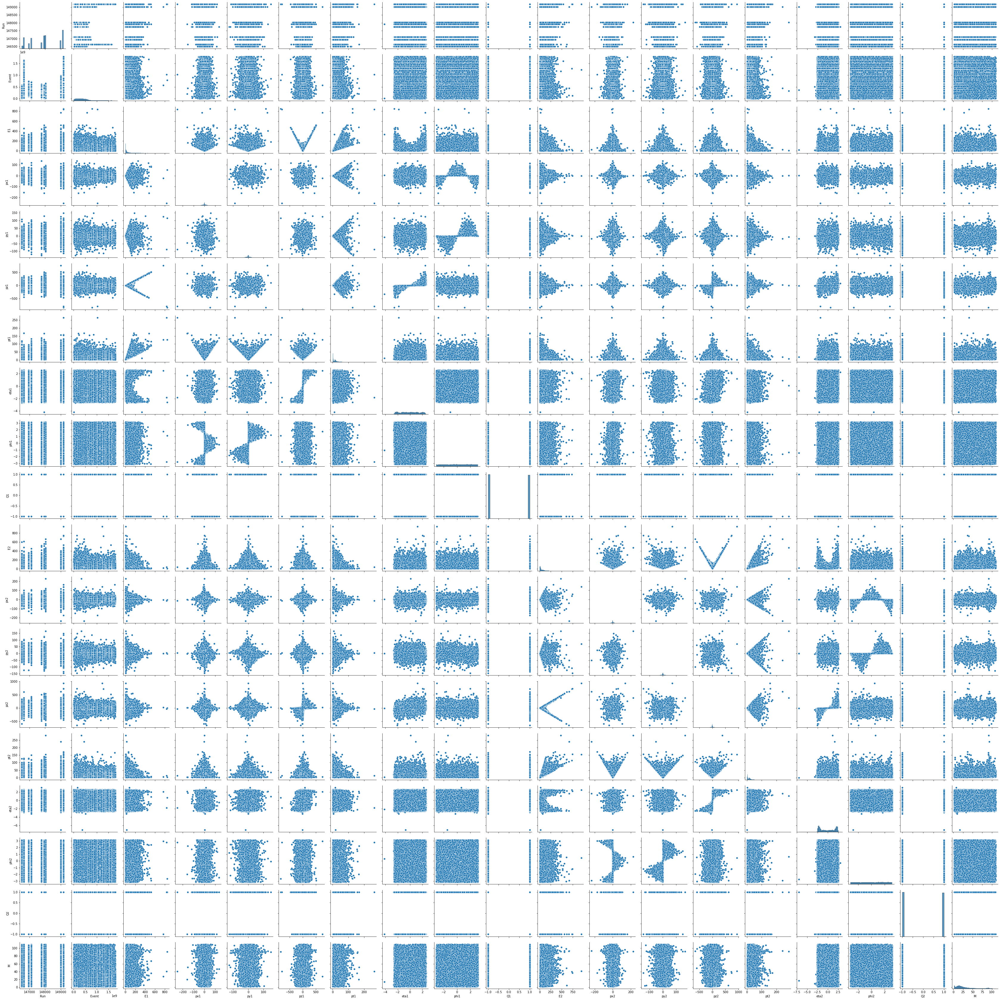

In [ ]:
# REPRESENTACIÓN BIDIMENSIONAL
# ================================================================

# Representación por parejas de todas las característias para que nos permita entender mejor sus relaciones.
sns.pairplot(raw);

- Podemos confirmar que las variables `Q1` y `Q2` son categóricas (1 o -1).
- La variable `Run` es una variable discreta ordinal que posteriormente analizaremos.
- Las variables `px1`, `py1`, `pz1`, y `px2`, `py2`,`pz2` están correlacionadas con la energía total `E1` y `E2` respectivamente, con un cálculo sencillo observamos que E es el módulo resultante de las componentes px py y pz. 
- También se intuye una relación lineal entre `phi1`, `phi2` y sus correspondientes energías `E1` y `E2`.

In [ ]:
# VARIABLES CATEGÓRICAS
# ================================================================

# Análisis de las frecuencias de las variables categóricas
raw['Run'].value_counts().sort_index()
raw['Q1'].value_counts().sort_index()
raw['Q2'].value_counts().sort_index()

146511     3016
146644    12629
146944     5824
147114     6150
147115     5844
147754     6838
147926     7559
147929     6893
148029     6763
148031     8195
149011     9259
149181    18109
149182     2921
Name: Run, dtype: int64

-1    50274
 1    49726
Name: Q1, dtype: int64

-1    50211
 1    49789
Name: Q2, dtype: int64

- `Run`: es una variable discreta ordinal que describe el número de ejecuciones de un evento recorriendo 13 valores concretos.
- `Q1` y `Q2`: Las cargas positiva o negativa se distribuyen con una frecuencia cercana al 50% para ambos electrones.

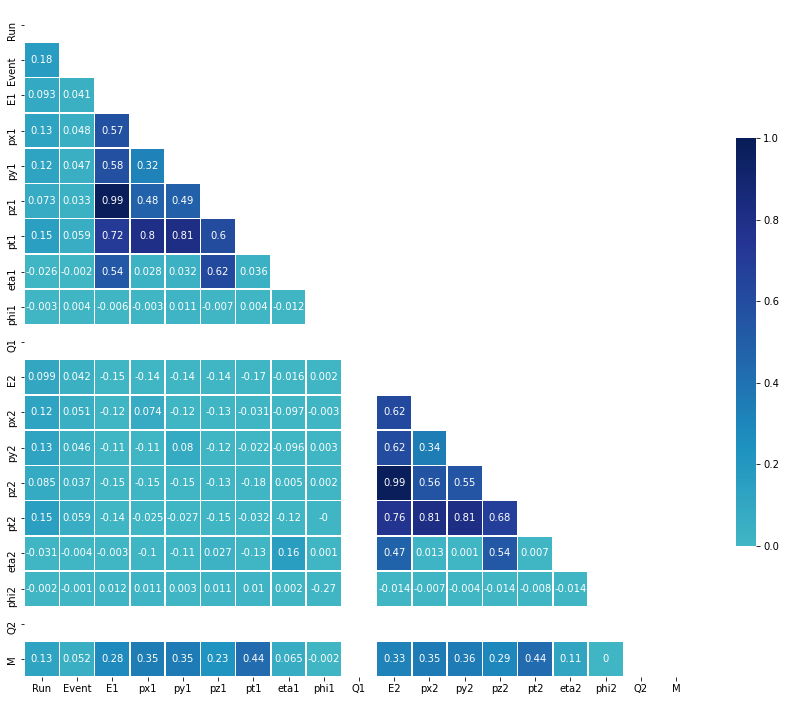

In [ ]:
# COEFICIENTES DE CORRELACIÓN
# ================================================================

# Representación del coeficiente de correlación lineal de Pearson que independientemente de la escala muestra el grado de linealidad entre variables
# corr = 1 o -1: correlación perfecta, corr = 0 ausencia de corrleación.
# El cálculo se ha realizado en valor absoluto para anular las simetrías detectadas anteriormente. 

corr = np.abs(raw).corr().round(3)
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

f, ax = plt.subplots(figsize=(15, 15))

sns.heatmap(corr, mask=mask, cmap="YlGnBu", vmin = 0.0, vmax=1.0, center=0, annot=True,
            square=True, linewidths=.5, cbar_kws={"shrink": .5});

- Ahora se evidencia la fuerte correlación entre las componentes `px1`, `py1`, `pz1`,`pt1`, y `px2`, `py2`,`pz2`,`pt2` y sus módulos `E1` y `E2`, especialmente.
- Tanto `eta1`, `eta2`, `phi1` y `phi2` tienen correlación significativa con sus componentes energéticas asociadas *x* *y* *z* y por ende con E. 
- `M` también está asociada con todas las componentes energéticas 1 y 2 aunque de manera más débil.

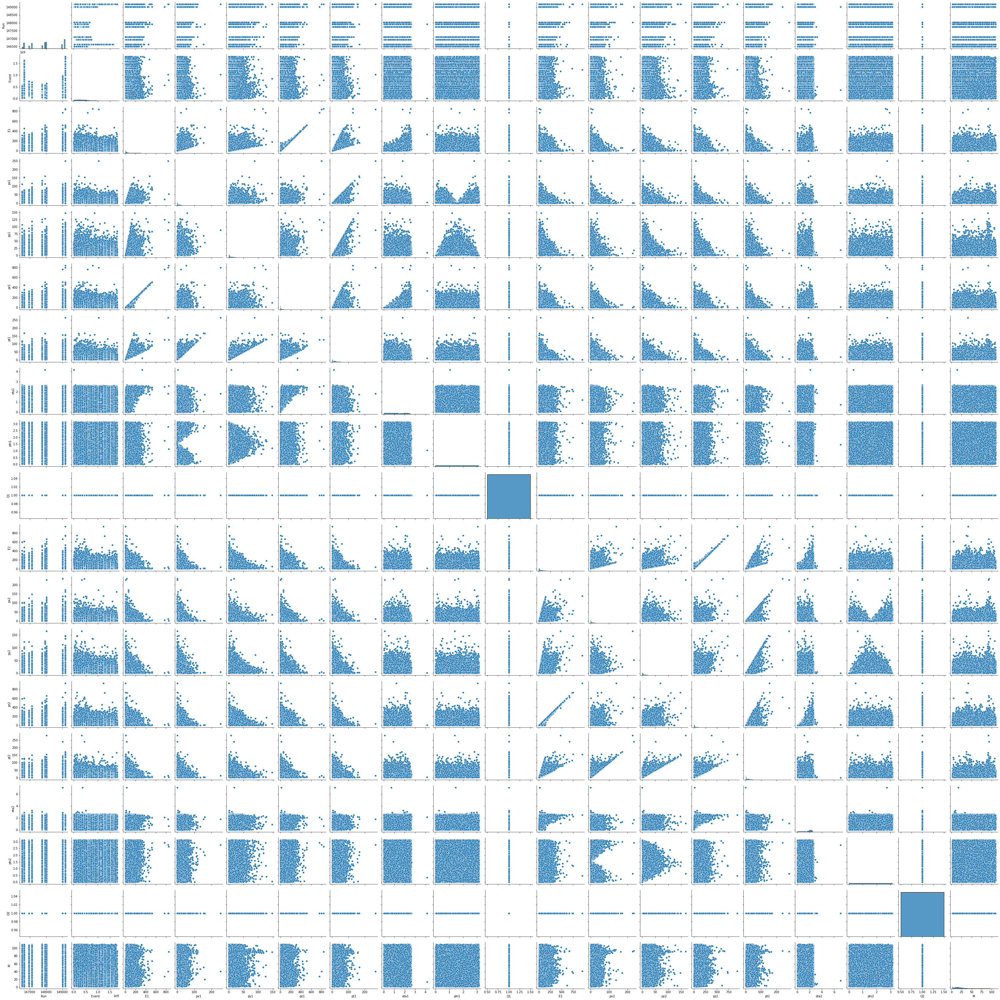

In [ ]:
# VARIABLES CATEGÓRICAS
# ================================================================

# Representamos nuevamente las variables en valor absoluto para apreciar mejor la linealidad de algunas de ellas.
sns.pairplot(np.abs(raw));

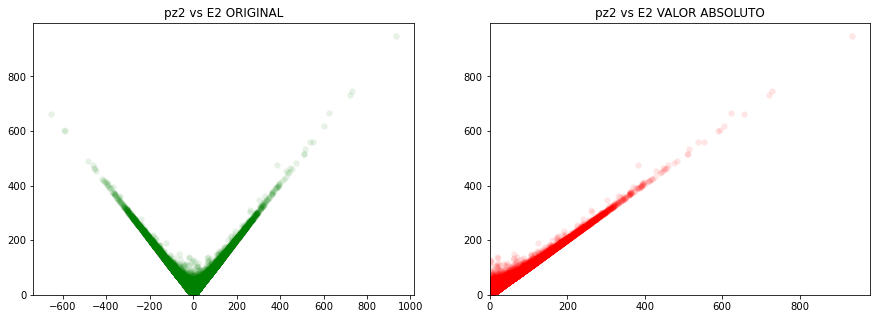

In [ ]:
# EJEMPLO DEL EFECTO DE LA TRANSFORMACIÓN
# ================================================================

plt.figure(figsize=(15, 5))

plt.subplot(121)
plt.scatter(x="pz2", y="E2", data=raw, color='g', alpha=0.1, linewidth=0.1)
plt.title('pz2 vs E2 ORIGINAL')
plt.ylim(0,)

plt.subplot(122)
# Influencia del tamaño del motor en el precio
plt.scatter(x="pz2", y="E2", data=np.abs(raw), color='r', alpha=0.1, linewidth=0.1)
plt.title('pz2 vs E2 VALOR ABSOLUTO')
plt.ylim(0,)
plt.xlim(0,);

## 5. Transformación del dataset original 

A la vista de la exploración anterior, ya tenemos una buena perspectiva de la morfología, distribución, correlación entre variables e importancia. Antes de comenzar con el modelizado vamos a hacer una serie de transformaciones que nos ayudarán a captar mejor las peculiaridades de los datos:
- Valor absoluto: Nos permitirá percibir la linealidad de algunas de las relaciones. 
- Creación de nuevas variables: A pesar del punto anterior, vamos a crear nuevas variables categóricas que recojan el signo de cada una de las componentes de los vectores ya que indican la dirección y sentido de los mismos y pueden desvelar más relaciones en un futuro, por lo tanto tendremos las variables para cada una de las componentes con su módulo en valor absoluto que a su vez irán asociadas a dos nuevas variables indicando su signo con un 1 o 0 a modo de variables categóricas.

In [ ]:
# TRANSFORMACIÓN
# ================================================================

# Transformamos en valores absolutos los datos iniciales.
# Eliminamos las vairables Q1 y Q2 para posteriormente dividirlos en dos diferentes (+, -).
data = np.abs(raw.drop(['Q1','Q2'], axis = 1))

# Definimos dos funciones que asociarán a cada valor 1 o 0 en función de si son positivos o negativos y viceversa.
def sign_pos (x):
    if x > 0:
        return 1
    else: 
        return 0

def sign_neg (x):
    if x < 0:
        return 1
    else:
        return 0

# Mediante un bucle 'for' creamos las nuevas variables aplicando las funciones anteriores.
features_trans = ['px1','py1','pz1','px2','py2','pz2','eta1','phi1','eta2','phi2','Q1','Q2']
for i in features_trans:
    data[i + '_+'] = raw[i].apply(lambda x: sign_pos(x))
    data[i + '_-'] = raw[i].apply(lambda x: sign_neg(x))

In [ ]:
# Nuevas variables creadas. 
data.iloc[:,19:]

,py1_+,py1_-,pz1_+,pz1_-,px2_+,px2_-,py2_+,py2_-,pz2_+,pz2_-,...,phi1_+,phi1_-,eta2_+,eta2_-,phi2_+,phi2_-,Q1_+,Q1_-,Q2_+,Q2_-
0,1,0,0,1,0,1,0,1,0,1,...,1,0,0,1,0,1,1,0,0,1
1,0,1,0,1,0,1,1,0,1,0,...,0,1,1,0,1,0,0,1,1,0
2,1,0,1,0,0,1,1,0,0,1,...,1,0,0,1,1,0,1,0,1,0
3,1,0,1,0,1,0,1,0,1,0,...,1,0,1,0,1,0,1,0,0,1
4,0,1,0,1,0,1,0,1,0,1,...,0,1,0,1,0,1,0,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,1,0,1,0,1,0,0,1,1,0,...,1,0,1,0,0,1,0,1,1,0
99996,1,0,0,1,0,1,0,1,0,1,...,1,0,0,1,0,1,1,0,1,0
99997,0,1,0,1,0,1,0,1,0,1,...,0,1,0,1,0,1,1,0,0,1
99998,1,0,1,0,1,0,1,0,1,0,...,1,0,1,0,1,0,0,1,1,0


## 6. Modelizado

Mediante *Elastic Net Regression* crearemos un modelo que relacione las características ya transformadas con la energía toal `E2`. Para la evaluación de los diferentes modelos que se describen a continuaicón se utilizarán dos métricas para analizar su bondad tanto con los datos de entrenamiento como con los de prueba. Debido al hecho de que no disponemos de más información sobre el *dataset*, **elegiremos *RMSE* como métrica de evaluación** permitiéndonos calcular el error cometido en las unidades de la variable objetivo. También aprovecharemos $R^2$ como referencia ya que es una métrica adicional que nos brinda el modelo. 
- $R^2$: Métrica inherente al modelo que recorre valores entre 0 y 1 donde uno representaría un modelo capaz de predecir la total variabilidad del sistema mientra que cero evidenciería la ausencia de correlación.
- $RMSE$: Raiz del error cuadrático medio: $RMSE = \sqrt{\frac{1}{N} \sum_{n=1}^N(y-\hat y)^2} $
> y = variable objetivo; $\hat y$ = variable predicha; N = Número de elementos.

### 6.1 Dividisión del dataset en train & test

In [ ]:
# DIVISIÓN DEL DATASET
# ================================================================

# Importamos la función que nos permitirá dividir nuestros datos en train & test.
from sklearn.model_selection import train_test_split

# Separamos los datos X: Matriz de variables independientes, y: variable objetivo. 
X = data.drop(['E2'], axis = 1)
y = data['E2']

# Separamos el dataset reservando un 20% de los elementos para comprobar el modelo.
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=32)

### 6.2 Elastic Net Regression (Estrategia Hold Out)

En primer lugar aplicamos el modelo original utilizando los parámetros que sugiere scikitlearn en su docuementación [sklearn.linear_model.ElasticNet](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.ElasticNet.html). **alpha =1**, **l1_ratio = 0.5**.

In [ ]:
# DEFINICIÓN DEL MODELO
# ================================================================

# Importamos el modelo a utilzar.
from sklearn.linear_model import ElasticNet

# Instanciamos el modelo.
ElNet = ElasticNet(alpha=1, l1_ratio=0.5, max_iter=3000)

# Calculamos el modelo con los datos de entrenamiento.
ElNet.fit(X_train, y_train)

ElasticNet(alpha=1, max_iter=3000)

In [ ]:
# CÁLCULO DE MÉTRICAS
# ================================================================

# Importamos la métrica a utilizar
from sklearn.metrics import mean_squared_error

# Predicción train & test
y_pred_train = ElNet.predict(X_train)
y_pred_test  = ElNet.predict(X_test)

# Error cuadrático medio train & test: 'MSE'
mse_train = mean_squared_error(y_train, y_pred_train)
mse_test  = mean_squared_error(y_test, y_pred_test)

# Raiz del Error cuadrático medio train & test: 'RMSE'
rmse_train = np.sqrt(mse_train)
rmse_test  = np.sqrt(mse_test)

# 'RMSE'
print(f"Métrica RMSE en entrenamiento: {rmse_train:.4f}")
print(f"Métrica RMSE en test         : {rmse_test:.4f} \n")

# 'R'
print(f"Métrica R2 en entrenamiento:   {ElNet.score(X_train, y_train):.4f}")
print(f"Métrica R2 en test:            {ElNet.score(X_test, y_test):.4f}")

Métrica RMSE en entrenamiento: 2.2839
Métrica RMSE en test         : 2.2490 

Métrica R2 en entrenamiento:   0.9976
Métrica R2 en test:            0.9976


Se observa un muy buen ajuste con valores de *R2* cercanos a uno lo que quiere decier que es capaz de explicar la mayor parte de la variabilidad del modelo. *RMSE* es bajo y homogeneo tanto en el dataset de entrenamiento como en el de prueba.

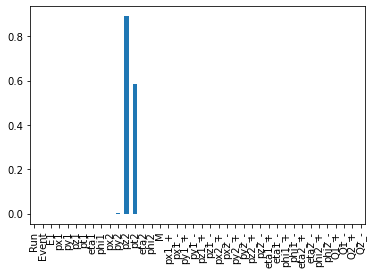

In [ ]:
# COEFICIENTES
# ================================================================

# Dibujamos los coeficientes
pd.Series(ElNet.coef_, index = X.columns).plot.bar();

De acuerdo a los datos arrojados el modelo es prometedor, además, de las 41 variables iniciales tan solo tienen una alta significancia dos de ellas `pz2` y `pt2`. No obstante es importante analizar la influencia del escalado de variables y la relevancia de las mismas, para ello procedemos a normalizar nuestro data set aproximándo cada variable a una distribución normal N(0,1) que nos permitirá homogeneizar los datos y adaptar la escala.

## 6.3 Importancia de las variables

In [ ]:
# ESCALADO MEDIANTE ESTANDARIZADO
# ================================================================

# Importamos el escalado a utilizar
from sklearn.preprocessing import StandardScaler

scaler         = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train) # estandarizamos con la media y desviación del dataset de entrenamiento.
X_test_scaled  = scaler.transform(X_test)      # aplicamos la media y desviación aprendidas en el dataset de entrenamiento.

# Utilizamos el modelo definido anteriormente para entrenar las variables estandarizadas. 
ElNet.fit(X_train_scaled, y_train)

# Predicción train & test
y_pred_train_scaled = ElNet.predict(X_train_scaled)
y_pred_test_scaled  = ElNet.predict(X_test_scaled)

# Error cuadrático medio train & test
mse_train = mean_squared_error(y_train, y_pred_train_scaled)
mse_test  = mean_squared_error(y_test,  y_pred_test_scaled)

# Raiz del Error cuadrático medio train & test: 'RMSE'
rmse_train = np.sqrt(mse_train)
rmse_test  = np.sqrt(mse_test)

# RMSE
print(f"Métrica RMSE en entrenamiento: {rmse_train:.4f}")
print(f"Métrica RMSE en test         : {rmse_test:.4f} \n")

# R2
print(f"Métrica R2 en entrenamiento:   {ElNet.score(X_train_scaled, y_train):.4f}")
print(f"Métrica R2 en test:            {ElNet.score(X_test_scaled, y_test):.4f}")   

ElasticNet(alpha=1, max_iter=3000)

Métrica RMSE en entrenamiento: 12.7525
Métrica RMSE en test         : 12.2313 

Métrica R2 en entrenamiento:   0.9264
Métrica R2 en test:            0.9286


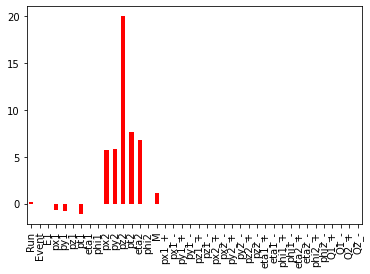

In [ ]:
# COEFICIENTES
# ================================================================

# Dibujamos los coeficientes
pd.Series(ElNet.coef_, index=X.columns).plot.bar(color='r');

En esta ocasión vemos que principalmente tres de las variabiles anteriormente anuladas han cobrado significancia `px2` `py2` y`eta2`, lo cuál evidencia la importancia de la escala, además el error *RMSE* ha aumentado considerablemente. 

## 6.4 Sensibilidad al escalado de variables

In [ ]:
# SENSIBILIDAD A LA ESCALA DE LAS VARIABLES
# ================================================================

# Importamos el modelo LinearRegression para poder comparar los resultados.
from sklearn.linear_model import LinearRegression

# Función de evaluación
def train_algo(seed, model):
    np.random.seed(seed=seed)                         # Fijamos el estado del generador de números aleatorios.
    scale_factors = np.random.rand(X_train.shape[1])  # Factores de escalado para cada variable.
    X_train_scaled = X_train*scale_factors            # Escalado mediante la multiplicación de los factores.
        
    if model == "ElasticNet":
        est = ElasticNet(alpha=1, l1_ratio=0.5, max_iter=3000)      
    elif model == "LinearRegression":
        est = LinearRegression(fit_intercept=True, normalize=False)

    est.fit(X_train_scaled, y_train)
    r2_train = est.score(X_train_scaled, y_train)
    print(f"Métrica R2 en entrenamiento: {r2_train}")

# Importamos los Widgets adecuados    
from ipywidgets import interact, interactive 
import ipywidgets as widgets

widget_seed = widgets.IntSlider(min=0, max=100, step=1, value=32, continuous_update=False, description='Semilla:')
widget_model = widgets.Dropdown(value='ElasticNet', placeholder='Elige algoritmo',
    options =['ElasticNet', 'LinearRegression'],
    description='Algoritmo:',
    ensure_option=True,
    disabled=False
)

print("""A continuación se muestran varios controles interactivos:
- "Semilla": variando este parámetro se consiguen generar diferentes escalados aleatorios de las variables
- "Algoritmo": permite seleccionar el algoritmo sobre el que evaluar la invariancia a la escala""")
interact(train_algo, model=widget_model, seed=widget_seed);

A continuación se muestran varios controles interactivos:
- "Semilla": variando este parámetro se consiguen generar diferentes escalados aleatorios de las variables
- "Algoritmo": permite seleccionar el algoritmo sobre el que evaluar la invariancia a la escala


interactive(children=(IntSlider(value=32, continuous_update=False, description='Semilla:'), Dropdown(descripti…

Utilizamos la misma estrategia seguida en el ejemplo de la actividad para demostrar como afecta la escala de las variables al resultado. Variando el factor de escalado se observa como el modelo *ElasticNet* cambia debido a la sensibilidad de los parámetros de regularización, mientras que *LinearRegression* no, luego debemos extremar precauciones a la hora de modelizar. 

## 7 Ajuste de los Hiperparámetros $\alpha y \lambda$

### 7.1 Elastic Net Regression Cross Validation Standarized

Para aclarar las dudas que nos sugiere el modelo anterior, vamos a utilizar una versión de ElasticNet llamadada [ElasticNetCV](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.ElasticNetCV.html) que nos permitirá seleccionar los mejores parámetros para el modelo mediante un algoritmo optimizado. También normalizaremos los datos para evitar problemas de escalado.

Parámetros a configurar:
- *alpha*: Seleccionamos un conjunto de candidatos que recorren el rango (1e-6 - 1e-1)(*) conteniendo 20 elementos.
- *l1_ratio*: Tomaremos el rango recomendado por Scikitlearn (0-1)(*) conteniendo 20 elementos.
- *Método de evaluación*: RepeatedKFold (10 *Folds* y 3 iteraciones aleatorias).

(*) Destacar que se ha descartado el 0 en ambos parámetros para envitar errores de convergencia.

In [ ]:
# MODELO ElasticNetCV
# ================================================================

# Importamos RepeatedKFold & ElasticNetCV.
from sklearn.model_selection import RepeatedKFold
from sklearn.linear_model import ElasticNetCV

# Definición del método de evaluación del modelo.
cv = RepeatedKFold(n_splits=10, n_repeats=3, random_state=42)

# Definición de los parámetros y el modelo.
alphas  = np.logspace(-6,-1, 20)
ratios  = np.linspace(0.01, 1, 20)

ElNetCV = ElasticNetCV(l1_ratio=ratios, alphas=alphas, cv=cv,  max_iter=5000, n_jobs=-1)

# Entrenamiento del modelo.
ElNetCV_std = ElNetCV.fit(X_train_scaled, y_train)

# Resumen de los parámetros seleccionados.
print('alpha:     %f' % ElNetCV_std.alpha_)
print('l1_ratio_: %f' % ElNetCV_std.l1_ratio_)

alpha:     0.000127
l1_ratio_: 1.000000


In [ ]:
# EVOLUCIÓN DE RMSE en función de alpha y l1_ratio.
# ================================================================

# Error medio de las 10 folds e iteraciones para cada combinación de alpha y l1_ratio. 
mean_error_cv = ElNetCV_std.mse_path_.mean(axis = 2)

# El resultado es un array de dimensiones (n_l1_ratio, n_alpha)
# Conversión a dataframe
df_resultados_cv = pd.DataFrame(
                                data   = mean_error_cv.flatten(),
                                index  = pd.MultiIndex.from_product( 
                                    iterables = [ElNetCV_std.l1_ratio, ElNetCV_std.alphas_],
                                    names     = ['l1_ratio', 'alphas']),
                               columns = ["MSE_CV"])

# Añadimos RMSE
df_resultados_cv['RMSE_CV'] = np.sqrt(df_resultados_cv['MSE_CV'])
df_resultados_cv = df_resultados_cv.reset_index().sort_values('MSE_CV', ascending = True)
df_resultados_cv.round(4)

,l1_ratio,alphas,MSE_CV,RMSE_CV
391,1.0000,0.0001,4.9702,2.2294
371,0.9479,0.0001,4.9702,2.2294
392,1.0000,0.0001,4.9702,2.2294
372,0.9479,0.0001,4.9702,2.2294
351,0.8958,0.0001,4.9702,2.2294
...,...,...,...,...
80,0.2184,0.1000,24.8567,4.9856
60,0.1663,0.1000,26.7427,5.1713
40,0.1142,0.1000,28.6437,5.3520
20,0.0621,0.1000,30.5523,5.5274


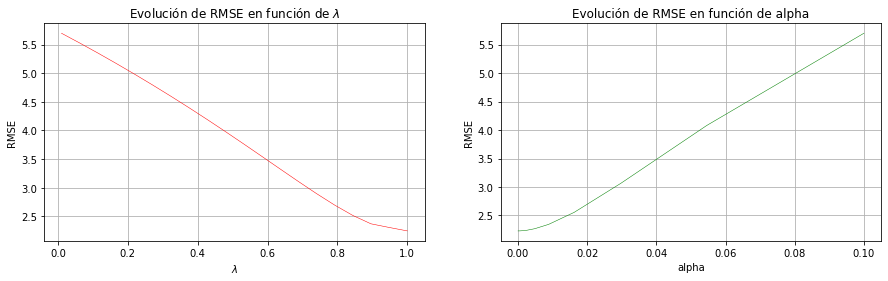

In [ ]:
# MEJORES RMSE ENCONTRADOS PARA CADA alpha y l1_ratio
# ================================================================

fig = plt.figure(figsize=(15, 4))
ax = fig.add_subplot(121)
df_resultados_cv.groupby('l1_ratio')['RMSE_CV'].max().plot(ax = ax, color='r', linewidth=0.5, grid=True)
ax.set_title('Evolución de RMSE en función de $\lambda$')
ax.set_xlabel('$\lambda$')
ax.set_ylabel('RMSE')

ax = fig.add_subplot(122)
df_resultados_cv.groupby('alphas')['RMSE_CV'].max().plot(ax = ax, color='g', linewidth=0.5, grid=True)
ax.set_title('Evolución de RMSE en función de alpha')
ax.set_xlabel('alpha')
ax.set_ylabel('RMSE');

In [ ]:
# CÁLCULO DE MÉTRICAS
# ================================================================

from sklearn.metrics import mean_squared_error

# Predicción train & test
y_pred_train_CV = ElNetCV_std.predict(X_train_scaled)
y_pred_test_CV  = ElNetCV_std.predict(X_test_scaled)

# Error cuadrático medio train & test
mse_train = mean_squared_error(y_train, y_pred_train_CV)
mse_test = mean_squared_error(y_test, y_pred_test_CV)

# Raiz del Error cuadrático medio train & test: 'RMSE'
rmse_train = np.sqrt(mse_train)
rmse_test  = np.sqrt(mse_test)

# RMSE
print(f"Métrica RMSE en entrenamiento: {rmse_train:.4f}")
print(f"Métrica RMSE en test         : {rmse_test:.4f} \n")

# R2
print(f"Métrica R2 en entrenamiento:   {ElNetCV.score(X_train_scaled, y_train):.4f}")
print(f"Métrica R2 en test:            {ElNetCV.score(X_test_scaled, y_test):.4f}")

Métrica RMSE en entrenamiento: 2.2277
Métrica RMSE en test         : 2.2002 

Métrica R2 en entrenamiento:   0.9978
Métrica R2 en test:            0.9977


Parece claro que la solución encontrada por el algoritmo es la que reduce *RMSE* al mínimo con los parámetros $\alpha: 0.000127 $ y $\lambda:1$, utilizando analogías con otras funciones de coste, este modelo podría ser resuelto con resultados similares con *Ridge* debido a que alpha es muy próximo a cero.
- ElasticNet: Ridge ($\alpha=0$) y Lasso ($\alpha=1$)

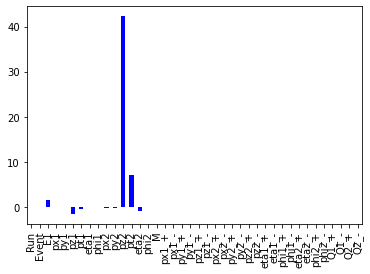

In [ ]:
# COEFICIENTES
# ================================================================

# Dibujamos los coeficientes
pd.Series(ElNetCV_std.coef_, index=X.columns).plot.bar(color='b');

Este modelo ha reducido de las 41 variables iniciales hasta 8 con mayor fiabilidad que el primero debido a las consideraciones tomadas.  Intuitivamente hubieramos apostado por una significancia predominante por `pz2` y en menor medida `pt2` lo que se confirma finalmente. Es interesante ver que aunque en menor medida la importancia que adquieren las componente `pz1` y `E1`, otorgan valor al modelo, lo que evidencia la correlación entre los dos electrones.

### 7.2 Validación cruzada

In [ ]:
# VALIDACIÓN CRUZADA
# ================================================================

# Importamos el validador. 
from sklearn.model_selection import cross_validate

# Definición del modelo con los parámetros óptimos anteriormente calculados.
ElNet_best = ElasticNet(alpha=ElNetCV_std.alpha_, l1_ratio=ElNetCV_std.l1_ratio_, max_iter=5000)

# Definición de las métricas y el método de validación.
scoring = ['neg_root_mean_squared_error', 'r2']
cv_scores = cross_validate(ElNet_best, X_train_scaled, y_train, cv=10, return_train_score=True, return_estimator=True, scoring=scoring)

cv_scores_df = pd.DataFrame((cv_scores.values()), index=['fit_time', 'score_time','estimator', 'RMSE_val', 'RMSE_train', 'R2_val', 'R2_train']).T
cv_scores_df.drop(['fit_time', 'score_time','estimator'], axis=1).abs()

,RMSE_val,RMSE_train,R2_val,R2_train
0,2.2899,2.22079,0.997709,0.997758
1,2.23774,2.22672,0.997736,0.997754
2,2.11373,2.24018,0.997867,0.99774
3,2.27807,2.22216,0.997708,0.997758
4,2.23396,2.22709,0.997652,0.997763
5,2.22097,2.2287,0.997831,0.997743
6,2.36631,2.2121,0.997521,0.997779
7,2.23109,2.22746,0.997762,0.997752
8,2.12615,2.23881,0.997947,0.997731
9,2.1885,2.23207,0.997761,0.997752


A diferencia del método *Hold Out* anteriormente utilizado, la validación cruzada nos permite eliminar la aleatoriedad al dividir el dataset en diferentes combinaciones *train & valid*. Se aprecia que existen ciertas diferencias entre los erroes cometidos en los *dataset* de entrenamiento y validación pero no son lo suficientemente significativos como para advertir sobreajuste.

In [ ]:
# PREDICCIÓN dataset test
# ================================================================

E2_pred = ElNetCV_std.predict(X_test_scaled)
results = pd.DataFrame(({'E2': y_test, 'E2_pred': E2_pred}))

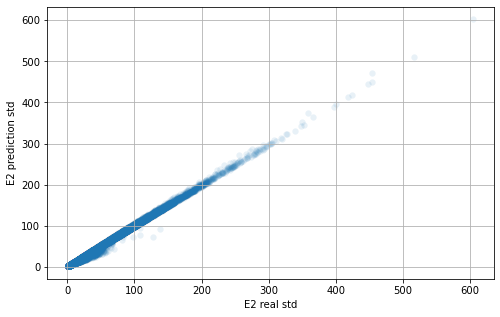

In [ ]:
# GRAFICADO
# ================================================================

plt.figure(1, figsize=(8, 5))
plt.scatter(y_test, E2_pred, alpha=0.1, linewidth=0.1)
plt.grid(True)
plt.xlabel('E2 real std')
plt.ylabel('E2 prediction std');

Parece razonable que la mayor desviación se produzca en la zona cercana a cero, tendencia que se observaba en las gráfica de correlación de variables iniciales tanto en `pz2` y `pt2` que son las variables de mayor significancia.

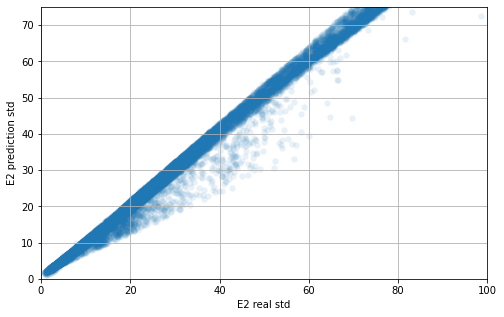

In [ ]:
# OUTLIERS
# ================================================================

plt.figure(1, figsize=(8, 5))
plt.scatter(y_test, E2_pred, alpha=0.1, linewidth=0.1)
plt.grid(True)
plt.xlim(0,100)
plt.ylim(0, 75)
plt.xlabel('E2 real std')
plt.ylabel('E2 prediction std');

Con un análisis más exhaustivo podríamos identificar los elementos discordantes que se aprecian al maximizar la zona comprendida entre 0-100 y refinar el modelo, por ejemplo agregando nuevas variables categóricas o eliminando *outliers*.

## 8. CONCLUSIONES

- El modelo descrito en el apartado 7. es nuestro modelo final capaz de predecir la energía `E2` en función de `pz2` y `pt2` y en menor medida `E1`, `pz1`, `pt1`, `px2`, `py2`, `eta2`.
- Podríamos volver a entrenar el modelo teniendo en cuenta tan solo `pz2` y `pt2`, aunque perdiéramos algo de precisión podríamos explicar el sistema con menos variables.
- El estandarizado y la validación cruzada han sido esenciales para captar la verdadera magnitud de las variables y validar el modelo.
- Las variables adicionales incluyendo el sigon vectorial y las cargas de los electrones no tienen ninguna influencia con la energía `E2`.
- el término independiente *Intercept*, anteriormente no mencionado también juega un papel importante y lo incluiremos en el modelo final.

In [ ]:
pd.DataFrame(ElNetCV_std.coef_, index=X.columns).round(4).T
print(f" Intercept: {ElNetCV_std.intercept_:.4f}")

,Run,Event,E1,px1,py1,pz1,pt1,eta1,phi1,px2,...,phi1_+,phi1_-,eta2_+,eta2_-,phi2_+,phi2_-,Q1_+,Q1_-,Q2_+,Q2_-
0,-0.0139,0.0178,1.5643,0.0293,0.0055,-1.4987,-0.3544,0.0932,-0.0034,-0.135,...,-0.0001,0.0,-0.0002,0.0,0.0,-0.0,0.0033,-0.0,-0.0182,0.0


 Intercept: 44.0743


## 9. COMPARATIVA ElasticNet vs Ridge

A la vista de la similitud del modelo final con Ridge vamos a calcular como curiosidad una regularización Ridge y comparar los resultados.

In [ ]:
# RIDGE 
# ================================================================

# Importamos el modelo.
from sklearn.linear_model import RidgeCV

# Definimos el rango de parámetros a evaluar.
alpha = np.logspace(-6, 0, 20)

# Instanciamos el modelo y lo entrenamos. 
Ridge_CV = RidgeCV(alphas=alpha, fit_intercept=True,)
Ridge_CV.fit(X_train_scaled, y_train)

# Resumen de los parámetros seleccionados.
print('alpha: %f' % Ridge_CV.alpha_);

alpha: 1.000000


In [ ]:
# CÁLCULO DE MÉTRICAS
# ================================================================

from sklearn.metrics import mean_squared_error

# Predicción train & test
y_pred_train_Ridge = Ridge_CV.predict(X_train_scaled)
y_pred_test_Ridge  = Ridge_CV.predict(X_test_scaled)

# Error cuadrático medio train & test
mse_train = mean_squared_error(y_train, y_pred_train_Ridge)
mse_test  = mean_squared_error(y_test, y_pred_test_Ridge)

# Raiz del Error cuadrático medio train & test: 'RMSE'.
rmse_train = np.sqrt(mse_train)
rmse_test  = np.sqrt(mse_test)

# RMSE
print(f"Métrica RMSE en entrenamiento: {rmse_train:.4f}")
print(f"Métrica RMSE en test         : {rmse_test:.4f} \n")

# R2
print(f"Métrica R2 en entrenamiento:   {Ridge_CV.score(X_train_scaled, y_train):.4f}")
print(f"Métrica R2 en test:            {Ridge_CV.score(X_test_scaled, y_test):.4f}")

Métrica RMSE en entrenamiento: 2.2277
Métrica RMSE en test         : 2.2003 

Métrica R2 en entrenamiento:   0.9978
Métrica R2 en test:            0.9977


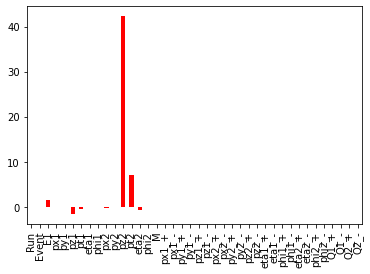

In [ ]:
# COEFICIENTES
# ================================================================

# Dibujamos los coeficientes
pd.Series(Ridge_CV.coef_, index=X.columns).plot.bar(color='r');

In [ ]:
# DIFERENCIA
# ================================================================

difference = (ElNetCV_std.coef_-Ridge_CV.coef_)
pd.DataFrame(({'ElasticNet': ElNetCV_std.coef_, 'Ridge': Ridge_CV.coef_, 'Difference': difference}), index=X_train.columns).round(4)

,ElasticNet,Ridge,Difference
Run,-0.0139,-0.0140,0.0001
Event,0.0178,0.0180,-0.0001
E1,1.5643,1.6359,-0.0716
px1,0.0293,0.0401,-0.0108
py1,0.0055,0.0164,-0.0109
pz1,-1.4987,-1.5628,0.0641
pt1,-0.3544,-0.3847,0.0303
eta1,0.0932,0.0952,-0.0019
phi1,-0.0034,-0.0044,0.0010
px2,-0.1350,-0.1427,0.0076


Se observa que ambos modelos conducen a resultados muy similares. 